# DeepAR Definitivo — Tuning con Optuna + covariable de pronóstico de El Niño

Dos mejoras sobre el DeepAR ya evaluado (MAE 147.18 a 30 días):
1. **Tuning de hiperparámetros con Optuna** — búsqueda automática de `hidden_size`, `num_layers`, `context_length`, `dropout_rate`
2. **Covariable de pronóstico de El Niño** — para los 30 días futuros, se usa una proyección del RONI basada en el reporte oficial de NOAA/CPC (categoría de fuerza cualitativa convertida a valor numérico vía interpolación), en vez de solo el valor observado histórico.

**Metodología de la covariable RONI futura:** NOAA/CPC no publica una tabla numérica de pronóstico descargable programáticamente (la página del outlook requiere sesión de navegador). Se usa en su lugar el reporte PDF mensual ("ENSO: Recent Evolution, Current Status and Predictions"), que sí es descargable, interpretando la categoría de fuerza declarada (Débil/Moderado/Fuerte/Muy Fuerte, según los umbrales oficiales de NOAA) y proyectando una transición lineal desde el último RONI observado hasta el punto medio histórico de esa categoría. **Esta covariable debe verificarse y actualizarse manualmente cada vez que se corra el notebook**, revisando el reporte más reciente en https://www.cpc.ncep.noaa.gov/products/analysis_monitoring/lanina/enso_evolution-status-fcsts-web.pdf

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, median_absolute_error, max_error
from gluonts.dataset.common import ListDataset
from gluonts.torch.model.deepar import DeepAREstimator
import optuna

BASE = Path.cwd().parents[1] / 'data' / 'processed'
df = pd.read_parquet(BASE / 'dataset_consolidado.parquet')
df.index = pd.to_datetime(df.index)

FREQ = "D"
PASOS = 30  # horizonte objetivo para este modelo definitivo

train_data = df[df.index < '2025-08-01']
test_data = df[(df.index >= '2025-08-01') & (df.index <= '2026-07-31')]

print(f"Train: {len(train_data)} días")
print(f"Test: {len(test_data)} días")

Train: 4595 días
Test: 365 días


## Covariable RONI futura (proyección de El Niño)

**⚠️ VERIFICAR MANUALMENTE antes de correr:** revisa el reporte más reciente de NOAA/CPC y ajusta `CATEGORIA_ACTUAL`, `RONI_ULTIMO_OBSERVADO` y `PERSISTENCIA_MESES` si cambiaron desde la última actualización de este notebook (17 de agosto de 2026: El Niño fortaleciéndose, RONI más reciente 1.0°C en MJJ 2026, >90% probabilidad de evento muy fuerte, se espera persista hasta primavera boreal 2027).

RONI proyectado (categoría: muy_fuerte, objetivo: 2.3):
2026-08-01    1.000000
2026-08-02    1.044828
2026-08-03    1.089655
2026-08-04    1.134483
2026-08-05    1.179310
2026-08-06    1.224138
2026-08-07    1.268966
2026-08-08    1.313793
2026-08-09    1.358621
2026-08-10    1.403448
2026-08-11    1.448276
2026-08-12    1.493103
2026-08-13    1.537931
2026-08-14    1.582759
2026-08-15    1.627586
2026-08-16    1.672414
2026-08-17    1.717241
2026-08-18    1.762069
2026-08-19    1.806897
2026-08-20    1.851724
2026-08-21    1.896552
2026-08-22    1.941379
2026-08-23    1.986207
2026-08-24    2.031034
2026-08-25    2.075862
2026-08-26    2.120690
2026-08-27    2.165517
2026-08-28    2.210345
2026-08-29    2.255172
2026-08-30    2.300000
Freq: D, dtype: float64


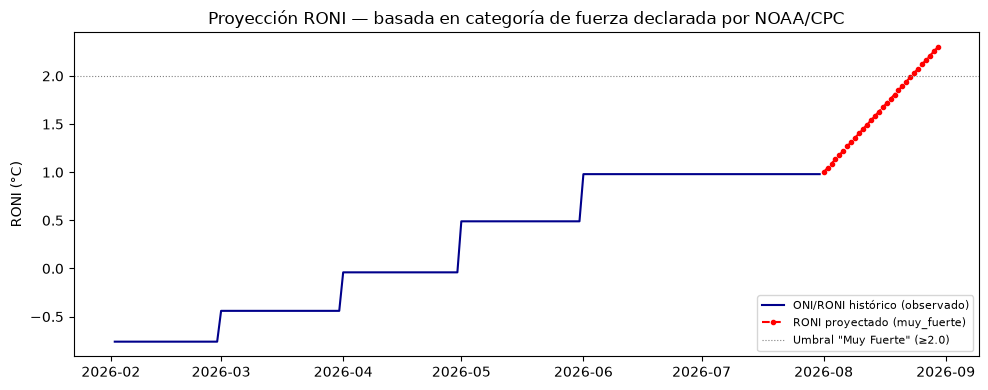

In [3]:
# --- Parámetros a verificar/actualizar manualmente cada corrida ---
# Fuente: https://www.cpc.ncep.noaa.gov/products/analysis_monitoring/lanina/enso_evolution-status-fcsts-web.pdf
RONI_ULTIMO_OBSERVADO = 1.0   # último valor RONI real reportado (MJJ 2026, según reporte del 17-ago-2026)
CATEGORIA_OUTLOOK = 'muy_fuerte'  # categoría declarada en el reporte: debil / moderado / fuerte / muy_fuerte

# Umbrales oficiales NOAA (punto medio de cada categoría; "muy_fuerte" usa el promedio
# histórico de eventos muy fuertes comparables: El Niño 1997-98 y 2015-16, ambos ~2.3-2.4)
PUNTOS_MEDIOS_CATEGORIA = {
    'debil': 0.7,
    'moderado': 1.2,
    'fuerte': 1.7,
    'muy_fuerte': 2.3
}

roni_objetivo = PUNTOS_MEDIOS_CATEGORIA[CATEGORIA_OUTLOOK]

fechas_futuras_roni = pd.date_range('2026-08-01', '2026-08-30', freq='D')

# Interpolación lineal desde el último valor observado hasta el objetivo de la categoría
roni_futuro_serie = pd.Series(
    np.linspace(RONI_ULTIMO_OBSERVADO, roni_objetivo, len(fechas_futuras_roni)),
    index=fechas_futuras_roni
)

print(f"RONI proyectado (categoría: {CATEGORIA_OUTLOOK}, objetivo: {roni_objetivo}):")
print(roni_futuro_serie)

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(df.index[-180:], df['ONI'].values[-180:], color='darkblue', label='ONI/RONI histórico (observado)')
ax.plot(roni_futuro_serie.index, roni_futuro_serie.values, color='red', linestyle='--', marker='o', markersize=3, label=f'RONI proyectado ({CATEGORIA_OUTLOOK})')
ax.axhline(2.0, color='gray', linestyle=':', linewidth=0.8, label='Umbral "Muy Fuerte" (≥2.0)')
ax.set_ylabel('RONI (°C)')
ax.legend(fontsize=8)
ax.set_title('Proyección RONI — basada en categoría de fuerza declarada por NOAA/CPC')
plt.tight_layout()
plt.show()

## Datasets con covariables (histórico observado + RONI proyectado para el futuro)

In [4]:
covariables = ['gen_termica', 'ONI', 'aportes_energia_gwh']

# Normalizar (fit SOLO con train)
scaler_cov = StandardScaler()
scaler_cov.fit(train_data[covariables])

df_scaled = df.copy()
df_scaled[covariables] = scaler_cov.transform(df[covariables])
train_data_scaled = df_scaled[df_scaled.index < '2025-08-01']

train_ds = ListDataset(
    [{
        "target": train_data_scaled['precio_bolsa'].values,
        "start": train_data_scaled.index[0],
        "feat_dynamic_real": train_data_scaled[covariables].values.T
    }],
    freq=FREQ
)

print("Dataset de entrenamiento (con covariables) listo")

Dataset de entrenamiento (con covariables) listo


## Tuning de hiperparámetros con Optuna

Validación interna: últimos 90 días de train (no se toca el test real). Cada trial entrena con `max_epochs` reducido para acelerar la búsqueda; el modelo final se reentrena con la configuración completa.

In [5]:
VENTANA_VALIDACION = 90

train_interno = train_data_scaled.iloc[:-VENTANA_VALIDACION]
val_interno = train_data_scaled.iloc[-VENTANA_VALIDACION:]

train_ds_interno = ListDataset(
    [{
        "target": train_interno['precio_bolsa'].values,
        "start": train_interno.index[0],
        "feat_dynamic_real": train_interno[covariables].values.T
    }],
    freq=FREQ
)

print(f"Train interno: {len(train_interno)} días | Validación interna: {len(val_interno)} días")

Train interno: 4505 días | Validación interna: 90 días


In [6]:
def objetivo(trial):
    hidden_size = trial.suggest_categorical('hidden_size', [32, 64, 128, 256])
    num_layers = trial.suggest_int('num_layers', 1, 3)
    context_length = trial.suggest_categorical('context_length', [90, 365, 730])
    dropout_rate = trial.suggest_float('dropout_rate', 0.0, 0.3)

    estimator = DeepAREstimator(
        freq=FREQ, prediction_length=PASOS, context_length=context_length,
        num_layers=num_layers, hidden_size=hidden_size, dropout_rate=dropout_rate,
        trainer_kwargs={"max_epochs": 20, "accelerator": "mps"}  # reducido para acelerar el trial
    )
    predictor = estimator.train(train_ds_interno)

    contexto_ds = ListDataset([{
        "target": train_interno['precio_bolsa'].values,
        "start": train_interno.index[0],
        "feat_dynamic_real": train_interno[covariables].values.T
    }], freq=FREQ)

    forecast = list(predictor.predict(contexto_ds))[0]
    pred = forecast.mean[:VENTANA_VALIDACION]
    real = val_interno['precio_bolsa'].values[:len(pred)]

    mae = np.mean(np.abs(real - pred))
    return mae


study = optuna.create_study(direction='minimize', study_name='deepar_tuning')
study.optimize(objetivo, n_trials=25, show_progress_bar=True)

print(f"\nMejor MAE de validación: {study.best_value:.2f}")
print(f"Mejores hiperparámetros: {study.best_params}")

[I 2026-08-23 14:29:42,929] A new study created in memory with name: deepar_tuning


  0%|          | 0/25 [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/torch/nn/modules/rnn.py:1011: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25450554625159005 and num_layers=1
  super().__init__("LSTM", *args, **kwargs)
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
💡 Tip: For seamless cloud logging and experiment trackin

Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:30:05,877] Trial 0 finished with value: 43.30149274780273 and parameters: {'hidden_size': 256, 'num_layers': 1, 'context_length': 90, 'dropout_rate': 0.25450554625159005}. Best is trial 0 with value: 43.30149274780273.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:31:13,501] Trial 1 finished with value: 28.71060967773437 and parameters: {'hidden_size': 64, 'num_layers': 3, 'context_length': 730, 'dropout_rate': 0.18284220703335735}. Best is trial 1 with value: 28.71060967773437.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:32:00,649] Trial 2 finished with value: 42.9516958984375 and parameters: {'hidden_size': 32, 'num_layers': 2, 'context_length': 730, 'dropout_rate': 0.08083765208597991}. Best is trial 1 with value: 28.71060967773437.



  | Name  | Type        | Params | Mode  | FLOPs | In sizes                                                         | Out sizes   
----------------------------------------------------------------------------------------------------------------------------------------
0 | model | DeepARModel | 217 K  | train | 2.8 M | [[1, 1], [1, 1], [1, 1822, 4], [1, 1822], [1, 1822], [1, 30, 4]] | [1, 100, 30]
----------------------------------------------------------------------------------------------------------------------------------------
217 K     Trainable params
0         Non-trainable params
217 K     Total params
0.872     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode
2.8 M     Total Flops
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:33:02,311] Trial 3 finished with value: 38.109705117187495 and parameters: {'hidden_size': 128, 'num_layers': 2, 'context_length': 730, 'dropout_rate': 0.2907573645656771}. Best is trial 1 with value: 28.71060967773437.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:33:31,715] Trial 4 finished with value: 25.902131640218094 and parameters: {'hidden_size': 256, 'num_layers': 1, 'context_length': 365, 'dropout_rate': 0.04100112569742655}. Best is trial 4 with value: 25.902131640218094.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:34:35,250] Trial 5 finished with value: 36.62960810587565 and parameters: {'hidden_size': 256, 'num_layers': 3, 'context_length': 365, 'dropout_rate': 0.17170775059027488}. Best is trial 4 with value: 25.902131640218094.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:35:26,809] Trial 6 finished with value: 37.06428698811849 and parameters: {'hidden_size': 64, 'num_layers': 2, 'context_length': 730, 'dropout_rate': 0.07930287259133613}. Best is trial 4 with value: 25.902131640218094.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:35:51,582] Trial 7 finished with value: 22.68064646891276 and parameters: {'hidden_size': 64, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.23205802306063203}. Best is trial 7 with value: 22.68064646891276.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:36:27,605] Trial 8 finished with value: 48.10237490681967 and parameters: {'hidden_size': 128, 'num_layers': 1, 'context_length': 730, 'dropout_rate': 0.04049731252092239}. Best is trial 7 with value: 22.68064646891276.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:37:29,046] Trial 9 finished with value: 24.298880968017574 and parameters: {'hidden_size': 128, 'num_layers': 2, 'context_length': 730, 'dropout_rate': 0.1686301504635866}. Best is trial 7 with value: 22.68064646891276.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:37:54,582] Trial 10 finished with value: 27.65839257568359 and parameters: {'hidden_size': 64, 'num_layers': 3, 'context_length': 90, 'dropout_rate': 0.22414320700212792}. Best is trial 7 with value: 22.68064646891276.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:38:19,406] Trial 11 finished with value: 41.14969274129232 and parameters: {'hidden_size': 128, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.14836561143464833}. Best is trial 7 with value: 22.68064646891276.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:38:43,081] Trial 12 finished with value: 20.23895139038086 and parameters: {'hidden_size': 32, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.2150018525011817}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:39:06,790] Trial 13 finished with value: 40.17468890055339 and parameters: {'hidden_size': 32, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.23415540961186967}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:39:30,389] Trial 14 finished with value: 26.4579686356608 and parameters: {'hidden_size': 32, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.2089602480995222}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:39:55,985] Trial 15 finished with value: 31.242193205159513 and parameters: {'hidden_size': 32, 'num_layers': 3, 'context_length': 90, 'dropout_rate': 0.29154348573045097}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:40:16,906] Trial 16 finished with value: 21.867449175618486 and parameters: {'hidden_size': 64, 'num_layers': 1, 'context_length': 90, 'dropout_rate': 0.1340787203870078}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:40:37,447] Trial 17 finished with value: 56.484080817464175 and parameters: {'hidden_size': 32, 'num_layers': 1, 'context_length': 90, 'dropout_rate': 0.11535437910803009}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:41:04,207] Trial 18 finished with value: 131.94658501790363 and parameters: {'hidden_size': 64, 'num_layers': 1, 'context_length': 365, 'dropout_rate': 0.12636907939156627}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:41:24,797] Trial 19 finished with value: 33.11990084676106 and parameters: {'hidden_size': 32, 'num_layers': 1, 'context_length': 90, 'dropout_rate': 0.10178230479390706}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:41:45,588] Trial 20 finished with value: 93.89704465417226 and parameters: {'hidden_size': 64, 'num_layers': 1, 'context_length': 90, 'dropout_rate': 0.19996052214562082}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:42:09,553] Trial 21 finished with value: 27.629998507080074 and parameters: {'hidden_size': 64, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.26065292831068243}. Best is trial 12 with value: 20.23895139038086.


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:42:33,561] Trial 22 finished with value: 21.826379261067704 and parameters: {'hidden_size': 64, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.2575244540669944}. Best is trial 12 with value: 20.23895139038086.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:42:58,881] Trial 23 finished with value: 23.104282115885415 and parameters: {'hidden_size': 64, 'num_layers': 3, 'context_length': 90, 'dropout_rate': 0.010384414184725105}. Best is trial 12 with value: 20.23895139038086.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

[I 2026-08-23 14:43:22,975] Trial 24 finished with value: 22.871816749674473 and parameters: {'hidden_size': 64, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.2676588652968415}. Best is trial 12 with value: 20.23895139038086.

Mejor MAE de validación: 20.24
Mejores hiperparámetros: {'hidden_size': 32, 'num_layers': 2, 'context_length': 90, 'dropout_rate': 0.2150018525011817}


In [7]:
import joblib

def encontrar_raiz_repo(marcador='.git'):
    actual = Path.cwd()
    while actual != actual.parent:
        if (actual / marcador).exists():
            return actual
        actual = actual.parent
    raise FileNotFoundError("No se encontró la raíz del repo")

raiz = encontrar_raiz_repo()
raiz.joinpath('models').mkdir(exist_ok=True)
joblib.dump(study, raiz / 'models' / 'optuna_study_deepar.pkl')
print("Estudio de Optuna guardado (para revisar trials después sin repetir la búsqueda)")

Estudio de Optuna guardado (para revisar trials después sin repetir la búsqueda)


## Reentrenar con los mejores hiperparámetros sobre train completo, evaluar en test real

In [8]:
mejores_params = study.best_params

estimator_final = DeepAREstimator(
    freq=FREQ, prediction_length=PASOS,
    context_length=mejores_params['context_length'],
    num_layers=mejores_params['num_layers'],
    hidden_size=mejores_params['hidden_size'],
    dropout_rate=mejores_params['dropout_rate'],
    trainer_kwargs={"max_epochs": 50, "accelerator": "mps"}
)

print("Entrenando DeepAR definitivo (hiperparámetros óptimos, train completo)...")
predictor_final = estimator_final.train(train_ds)
print("Entrenamiento completo")

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name  | Type        | Params | Mode  | FLOPs | In sizes                                                         | Out sizes   
----------------------------------------------------------------------------------------------------------------------------------------
0 | model | DeepARModel | 17.6 K | train | 574 K | [[1, 1], [1, 1], [1, 1182, 4], [1, 1182], [1, 1182], [1, 30, 4]] | [1, 100, 30]
--------------------------------------------------------------------------------------------

Entrenando DeepAR definitivo (hiperparámetros óptimos, train completo)...


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

Entrenamiento completo


In [9]:
def walk_forward_deepar_cov(predictor, test_data, pasos, covariables, df_scaled, serie_inicial):
    predicciones, fechas_pred = [], []
    q10, q90 = [], []
    serie_actual = serie_inicial.copy()

    for i in range(0, len(test_data), pasos):
        pasos_bloque = min(pasos, len(test_data) - i)
        fecha_fin_bloque = test_data.index[i + pasos_bloque - 1]
        covariables_slice = df_scaled.loc[serie_actual.index[0]:fecha_fin_bloque, covariables]

        contexto_ds = ListDataset([{
            "target": serie_actual['precio_bolsa'].values,
            "start": serie_actual.index[0],
            "feat_dynamic_real": covariables_slice.values.T
        }], freq=FREQ)

        forecast = list(predictor.predict(contexto_ds))[0]
        predicciones.extend(forecast.mean[:pasos_bloque])
        fechas_pred.extend(test_data.index[i:i+pasos_bloque])
        q10.extend(forecast.quantile(0.1)[:pasos_bloque])
        q90.extend(forecast.quantile(0.9)[:pasos_bloque])

        nuevo_bloque = df_scaled.loc[test_data.index[i:i+pasos_bloque], ['precio_bolsa']]
        serie_actual = pd.concat([serie_actual, nuevo_bloque])

    return pd.DataFrame({'y_pred': predicciones, 'q10': q10, 'q90': q90}, index=fechas_pred)


pred_final = walk_forward_deepar_cov(
    predictor_final, test_data['precio_bolsa'], PASOS, covariables, df_scaled, train_data_scaled
)
real_final = test_data['precio_bolsa'].loc[pred_final.index]

mae_final = np.mean(np.abs(real_final - pred_final['y_pred']))
rmse_final = np.sqrt(np.mean((real_final - pred_final['y_pred'])**2))
mape_final = np.mean(np.abs((real_final - pred_final['y_pred']) / real_final)) * 100

print(f"DeepAR Definitivo (30d): MAE={mae_final:.2f} | RMSE={rmse_final:.2f} | MAPE={mape_final:.2f}%")
print(f"DeepAR original (30d, sin tuning): MAE=147.18")
print(f"Mejora: {147.18 - mae_final:.2f} ({(147.18 - mae_final) / 147.18 * 100:.1f}%)")

/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]
/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexin

DeepAR Definitivo (30d): MAE=143.82 | RMSE=190.11 | MAPE=46.59%
DeepAR original (30d, sin tuning): MAE=147.18
Mejora: 3.36 (2.3%)


In [10]:
def agregar_metricas(nombre, real, pred, archivo, horizonte):
    real = np.array(real)
    pred = np.array(pred)
    mae = np.mean(np.abs(real - pred))
    rmse = np.sqrt(np.mean((real - pred)**2))
    mape = np.mean(np.abs((real - pred) / real)) * 100
    smape = np.mean(2 * np.abs(real - pred) / (np.abs(real) + np.abs(pred))) * 100
    r2 = r2_score(real, pred)
    medae = median_absolute_error(real, pred)
    max_err = max_error(real, pred)
    sesgo = np.mean(pred - real)

    nueva_fila = pd.DataFrame([{
        'Modelo': nombre, 'Horizonte': horizonte,
        'MAE': round(mae, 2), 'RMSE': round(rmse, 2), 'MAPE (%)': round(mape, 2),
        'sMAPE (%)': round(smape, 2), 'R²': round(r2, 4), 'MedAE': round(medae, 2),
        'MaxError': round(max_err, 2), 'Sesgo': round(sesgo, 2)
    }])

    if archivo.exists():
        tabla = pd.read_parquet(archivo)
        tabla = tabla[~((tabla['Modelo'] == nombre) & (tabla['Horizonte'] == horizonte))]
        tabla = pd.concat([tabla, nueva_fila], ignore_index=True)
    else:
        tabla = nueva_fila

    tabla.to_parquet(archivo, index=False)
    print(f"'{nombre}' (horizonte={horizonte}d) guardado en {archivo}")
    return tabla


archivo_tabla = raiz / 'data' / 'processed' / 'tabla_metricas.parquet'
agregar_metricas('DeepAR Definitivo (Optuna + RONI forecast)', real_final, pred_final['y_pred'], archivo_tabla, horizonte=30)

'DeepAR Definitivo (Optuna + RONI forecast)' (horizonte=30d) guardado en /Users/maguverm/Documents/tesis-bolsa/data/processed/tabla_metricas.parquet


,Modelo,Horizonte,MAE,RMSE,MAPE (%),sMAPE (%),R²,MedAE,MaxError,Sesgo
0,"SARIMA(1,0,1)(1,0,1,7)",1,37.69,54.29,13.02,12.82,0.9342,26.82,276.52,-5.10
1,"SARIMA(2, 0, 2)(1, 0, 1, 7)",1,37.58,54.20,12.97,12.77,0.9344,26.23,277.91,-5.01
2,"SARIMAX(2,0,2)(1,0,1,7)",1,40.30,58.92,14.03,14.09,0.9225,26.23,332.33,-2.94
3,"SARIMA(1,0,1)(1,0,1,7)",7,64.28,91.51,21.33,21.09,0.8130,44.67,545.09,-12.39
4,"SARIMA(2, 0, 2)(1, 0, 1, 7)",7,64.04,91.06,21.30,21.00,0.8149,44.51,543.74,-11.81
5,"SARIMAX(2,0,2)(1,0,1,7)",7,56.65,79.27,19.23,19.74,0.8597,40.85,293.12,-4.37
6,"SARIMA(1,0,1)(1,0,1,7)",30,115.00,156.19,41.19,37.79,0.4554,88.01,583.55,-37.42
7,"SARIMA(2, 0, 2)(1, 0, 1, 7)",30,114.67,155.20,41.40,37.85,0.4622,88.77,581.97,-35.72
8,"SARIMAX(2,0,2)(1,0,1,7)",30,74.53,105.00,26.72,26.63,0.7539,53.30,424.28,-21.55
9,LSTM,1,43.36,59.65,15.69,15.04,0.9206,31.34,275.97,0.10


## Forecast al futuro (con la covariable RONI proyectada)

In [11]:
# Extender covariables históricas con el RONI proyectado para agosto 2026
df_scaled_futuro = df_scaled.copy()

roni_futuro_scaled = (roni_futuro_serie.values - scaler_cov.mean_[1]) / scaler_cov.scale_[1]  # ONI es la 2da covariable

filas_futuras = pd.DataFrame(index=fechas_futuras_roni, columns=df_scaled_futuro.columns, dtype=float)
filas_futuras['ONI'] = roni_futuro_scaled
# gen_termica y aportes_energia_gwh futuros: promedio estacional (mismo criterio que SARIMAX)
for fecha in fechas_futuras_roni:
    mismo_dia = df[(df.index.month == fecha.month) & (df.index.day == fecha.day) & (df.index < '2026-08-01')]
    for cov in ['gen_termica', 'aportes_energia_gwh']:
        valor_hist = mismo_dia[cov].mean()
        filas_futuras.loc[fecha, cov] = (valor_hist - scaler_cov.mean_[covariables.index(cov)]) / scaler_cov.scale_[covariables.index(cov)]

target_completo = pd.concat([train_data, test_data])['precio_bolsa']
covariables_completas_futuro = pd.concat([
    df_scaled.loc[target_completo.index[0]:target_completo.index[-1], covariables],
    filas_futuras[covariables]
])

contexto_ds_futuro = ListDataset([{
    "target": target_completo.values,
    "start": target_completo.index[0],
    "feat_dynamic_real": covariables_completas_futuro.values.T
}], freq=FREQ)

forecast_futuro = list(predictor_final.predict(contexto_ds_futuro))[0]

print(f"Forecast generado: {fechas_futuras_roni[0].date()} → {fechas_futuras_roni[-1].date()}")

Forecast generado: 2026-08-01 → 2026-08-30


/opt/anaconda3/envs/tesis-bolsa/lib/python3.12/site-packages/gluonts/torch/util.py:205: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:355.)
  return a[idx]


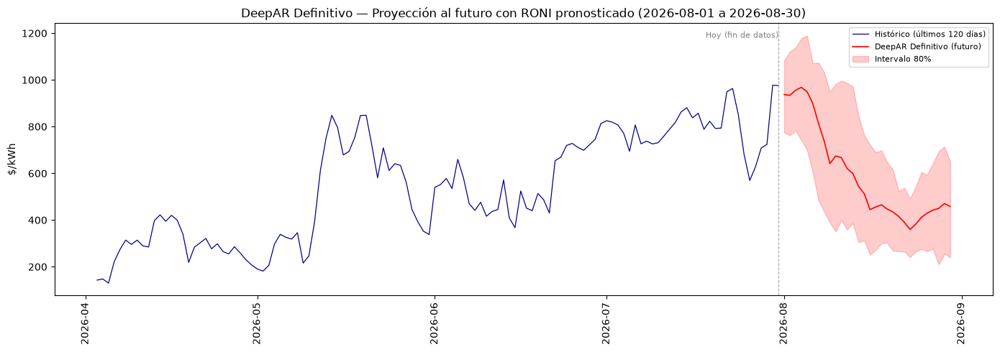

In [12]:
fig, ax = plt.subplots(figsize=(14, 5))

contexto_reciente = target_completo[-120:]
ax.plot(contexto_reciente.index, contexto_reciente.values, color='darkblue', linewidth=0.9, label='Histórico (últimos 120 días)')
ax.plot(fechas_futuras_roni, forecast_futuro.mean, color='red', linewidth=1.2, label='DeepAR Definitivo (futuro)')
ax.fill_between(fechas_futuras_roni, forecast_futuro.quantile(0.1), forecast_futuro.quantile(0.9),
                 alpha=0.2, color='red', label='Intervalo 80%')

ax.axvline(target_completo.index[-1], color='gray', linestyle='--', linewidth=0.8, alpha=0.7)
ax.text(target_completo.index[-1], ax.get_ylim()[1]*0.95, 'Hoy (fin de datos)', fontsize=8, color='gray', ha='right')

ax.set_ylabel('$/kWh')
ax.tick_params(axis='x', rotation=90)
ax.legend(fontsize=8)
ax.set_title(f'DeepAR Definitivo — Proyección al futuro con RONI pronosticado ({fechas_futuras_roni[0].date()} a {fechas_futuras_roni[-1].date()})')
plt.tight_layout()
plt.show()

In [13]:
predictor_final.serialize(raiz / 'models' / 'deepar_definitivo')
joblib.dump(scaler_cov, raiz / 'models' / 'deepar_definitivo_scaler.pkl')
print("Modelo definitivo guardado — próxima vez se puede cargar sin reentrenar:")
print("from gluonts.torch.model.predictor import PyTorchPredictor")
print("predictor_final = PyTorchPredictor.deserialize(raiz / 'models' / 'deepar_definitivo')")

FileNotFoundError: [Errno 2] No such file or directory: '/Users/maguverm/Documents/tesis-bolsa/models/deepar_definitivo/gluonts-config.json'